In [ ]:
# IMPORTANT:
#   Whenever you start a new colab runtime, use the following code to download
#   the training dataset onto the runtime local storage.
#   This should take ~3-5 mins for the whole dataset.
#   You can then load data from the local storage (/content/data) into your colab
#   notebook using the `h5py` library (see example below).
from huggingface_hub import hf_hub_download
hf_hub_download(repo_id="benmoseley/ese-dl-2024-25-group-project", filename="train.h5", repo_type="dataset", local_dir="data")
hf_hub_download(repo_id="benmoseley/ese-dl-2024-25-group-project", filename="events.csv", repo_type="dataset", local_dir="data")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


train.h5:   0%|          | 0.00/10.7G [00:00<?, ?B/s]

events.csv:   0%|          | 0.00/782k [00:00<?, ?B/s]

'data/events.csv'

## Task 1a: Dataset consists of "vil" images (Vertically Integrated Liquid) with 12 input frames predicting 12 future frames.
Preprocessing steps include:
1. Resizing to 192×192 pixels.As 384x384 needs more computational cost and time consuming.
2. Normalization: Ensuring values are scaled properly.
3. Splitting into train/test sets (80/20 split)

## Task 1A: Model Exploration and Performance Evaluation
In Task 1A, I experimented with four different models to evaluate their performance in storm prediction. The models ranged from the baseline ConvLSTM model to progressively more advanced architectures, culminating in a deeper and larger 3D CNN UNet model. The models I tested include:

#### Baseline ConvLSTM Model:

A standard ConvLSTM architecture that leverages convolutional and recurrent layers to process spatiotemporal information.
#### UNetLSTM Model: 

A modified UNet structure combined with LSTM layers, integrating encoder-decoder mechanisms for improved feature extraction.
#### 3D CNN UNet Model: 

A fully convolutional 3D UNet that captures spatial and temporal correlations more effectively than the 2D-based models.
#### Deep 3D CNN UNet Model (Final Model): 

An enhanced version of the 3D CNN UNet, incorporating deeper layers, residual blocks, and bottlenecks to further refine feature extraction.

Among these models, the Deep 3D CNN UNet demonstrated superior performance. The advantage of using a 3D CNN over 2D CNN-based models lies in its ability to better capture spatial and temporal dependencies, which are crucial for accurately predicting storm evolution. Additionally, the UNet structure—with its encoder-decoder design, skip connections, and residual bottlenecks—enables effective information flow and feature preservation.

#### Performance Analysis
Visualization and Loss Evaluation: By examining the prediction visualizations and loss curves, it is evident that the Deep 3D CNN UNet achieved the best overall performance.

Training Loss: The model reached a training loss of approximately 0.05, indicating that it learned the patterns in the training data very effectively, with minimal error.

Testing Loss: While the testing loss was slightly higher than the training loss, the model still generalizes well to unseen data. However, it does not capture fine-grained details perfectly, suggesting some room for improvement in predicting small-scale variations.

## Task 1B: Incorporating Multi-Channel Inputs
In Task 1B, the primary modification was increasing the number of input channels from 1 to 4, utilizing four different types of images as input to predict the future 12 vil images. This multi-channel approach provides additional contextual information, which is expected to improve predictive performance. For this task, I tested two models:

#### Baseline ConvLSTM Model (as in Task 1A)

#### 3D CNN UNet Model (final model for Task 1B)
Performance Analysis
Training Loss: The final 3D CNN UNet model achieved a training loss of 0.007, which is significantly lower than the best-performing model in Task 1A.

Validation Loss: The validation loss for this model was 0.013, indicating strong generalization ability to unseen data.
Comparison with Task 1A: The overall performance in Task 1B is notably better than Task 1A. This improvement is primarily due to the increased number of input channels, which allows the model to leverage more comprehensive information for future frame prediction.
Key Takeaways

The Deep 3D CNN UNet model outperforms all other architectures in both tasks, confirming the effectiveness of 3D convolutions and UNet’s encoder-decoder structure in capturing spatiotemporal dependencies.
Multi-channel inputs (Task 1B) significantly improve prediction quality, as they provide richer contextual information, leading to lower loss values compared to Task 1A.

The slight increase in test loss in Task 1A suggests that while the model generalizes well, further optimization (such as regularization techniques or additional fine-tuning) may enhance its ability to capture finer details.
Overall, these findings highlight the importance of both model architecture and input data richness in achieving accurate storm predictions.

## data Inspection

In [ ]:
import h5py
import matplotlib.pyplot as plt
import IPython
import PIL
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from skimage.transform import resize
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, BatchNormalization, Conv3D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
import os
import io
import shutil
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, ConvLSTM2D, BatchNormalization, Conv3D, Conv3DTranspose,
                                     concatenate, TimeDistributed)
from tensorflow.keras.layers import (Input, Conv3D, BatchNormalization, Conv3DTranspose,
                                     concatenate, Dropout)
from tensorflow.keras.layers import (Input, Conv3D, BatchNormalization, Conv3DTranspose,
                                     concatenate, Dropout)

In [ ]:
# this DataFrame contains all of the event meta data
df = pd.read_csv("data/events.csv", parse_dates=["start_utc"])
df

,id,img_type,start_utc,llcrnrlat,llcrnrlon,urcrnrlat,urcrnrlon,proj,height_m,width_m
0,S778114,ir069,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
1,S778114,ir107,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
2,S778114,lght,NaT,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3,S778114,vil,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
4,S778114,vis,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
...,...,...,...,...,...,...,...,...,...,...
3995,S832818,ir069,2019-07-28 17:44:00+00:00,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3996,S832818,ir107,2019-07-28 17:44:00+00:00,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3997,S832818,lght,NaT,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3998,S832818,vil,2019-07-28 17:45:00+00:00,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0


In [ ]:
print(f"Total number of events: {len(df.id.unique())}")

Total number of events: 800


In [ ]:
# this function loads all of the image arrays for a given id
def load_event(id):
    "Load event"
    with h5py.File(f'data/train.h5','r') as f:
        event = {img_type: f[id][img_type][:] for img_type in ['vis', 'ir069', 'ir107', 'vil', 'lght']}
    return event

event = load_event("S778114")
for img_type in event:
    print(f"{img_type}: {event[img_type].shape} ({event[img_type].dtype})")

vis: (384, 384, 36) (int16)
ir069: (192, 192, 36) (int16)
ir107: (192, 192, 36) (int16)
vil: (384, 384, 36) (uint8)
lght: (38777, 5) (float32)


## Data preprocessing


In [ ]:
from utils.preprocessing import EventDataLoader

h5_file_path = "/content/data/train.h5"
events_csv_path = "/content/data/events.csv"

# Instantiate the data loader
data_loader = EventDataLoader(h5_file_path, events_csv_path)

# Get event IDs
event_ids = data_loader.get_event_ids(image_type="vil")

# Preprocess data for a single modality
X, y = data_loader.preprocess_data(event_ids, input_frames=12, target_frames=12, image_size=(128, 128))

# Split train and test data
X_train, X_test, y_train, y_test = data_loader.split_train_test(X, y)

print("Input shape:", X.shape)
print("Target shape:", y.shape)

Selected event IDs: ['S778114', 'S767475', 'S771210', 'S782022', 'S769788', 'S782134', 'S780339', 'S780175', 'S769599', 'S780322']
Input shape: (1200, 128, 128, 12, 1)
Target shape: (1200, 128, 128, 12, 1)


## Baseline: ConvLSTM model

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv_lstm2d_4 (ConvLSTM2D)           │ (None, 128, 128, 12, 64)    │         150,016 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128, 128, 12, 64)    │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_5 (ConvLSTM2D)           │ (None, 128, 128, 12, 64)    │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128, 128, 12, 64)    │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_2 (Conv3D)                    │ (None, 128, 128, 12, 1)     │           1,729 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 447,425 (1.71 MB)

 Trainable params: 447,169 (1.71 MB)

 Non-trainable params: 256 (1.00 KB)

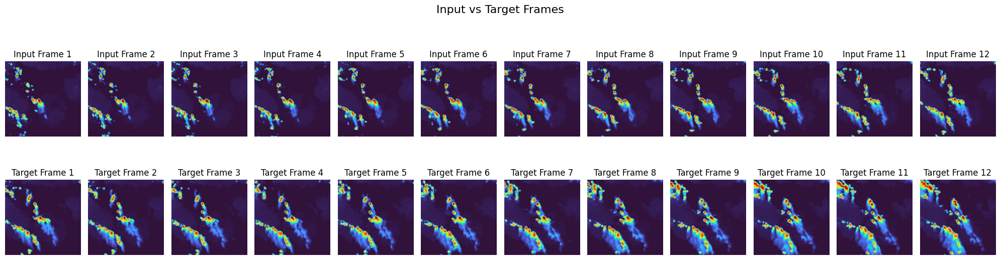

Epoch 1/100
 5/60 ━━━━━━━━━━━━━━━━━━━━ 24s 452ms/step - loss: 0.3766 - mae: 0.3766

/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/model_checkpoint.py:202: UserWarning: Can save best model only with val_loss available, skipping.
  self._save_model(epoch=self._current_epoch, batch=batch, logs=logs)


60/60 ━━━━━━━━━━━━━━━━━━━━ 36s 507ms/step - loss: 0.1990 - mae: 0.1990 - val_loss: 0.1087 - val_mae: 0.1087 - learning_rate: 0.0010
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 480ms/step - loss: 0.0775 - mae: 0.0775 - val_loss: 0.1112 - val_mae: 0.1112 - learning_rate: 0.0010
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 480ms/step - loss: 0.0631 - mae: 0.0631 - val_loss: 0.1207 - val_mae: 0.1207 - learning_rate: 0.0010
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 480ms/step - loss: 0.0652 - mae: 0.0652 - val_loss: 0.1223 - val_mae: 0.1223 - learning_rate: 0.0010
Epoch 5/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 480ms/step - loss: 0.0598 - mae: 0.0598 - val_loss: 0.1291 - val_mae: 0.1291 - learning_rate: 0.0010
Epoch 6/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 480ms/step - loss: 0.0537 - mae: 0.0537 - val_loss: 0.1195 - val_mae: 0.1195 - learning_rate: 0.0010
Epoch 7/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 481ms/step - loss: 0.0542 - mae: 0.0542 - val_loss: 0.1113 - val_mae: 0.1113 - learning_rate: 8.0000e-04


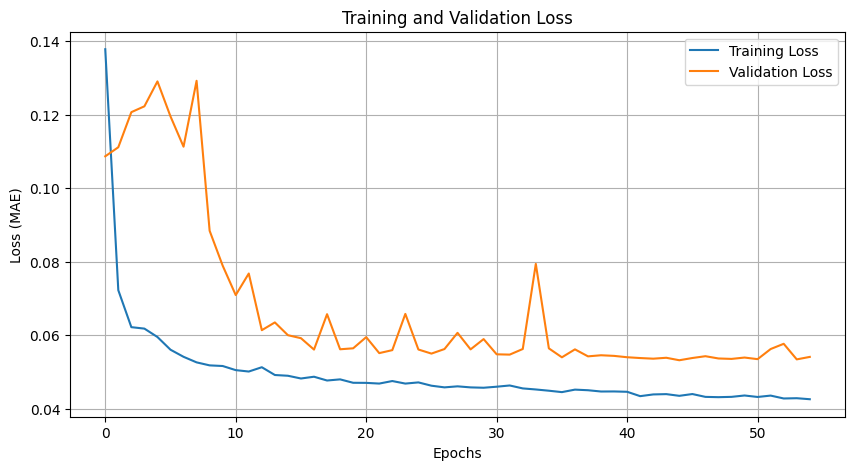

In [ ]:
from utils.models import ModelTimeSteppingPrediction

# Model Configuration
input_shape = (128, 128, 12, 1)  # Assuming (H, W, T, C)
output_frames = 12

# Instantiate the class
model_predictor = ModelTimeSteppingPrediction(input_shape, output_frames)

# Create and compile the model
model = model_predictor.create_conv_lstm()
model.summary()

# Train the model
epochs = 100
batch_size = 16
trained_model, history = model_predictor.train_model(model, X_train, y_train, X_test, y_test, epochs=epochs, batch_size=batch_size)


### Visuliase prediction on Test datasets

Best model loaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


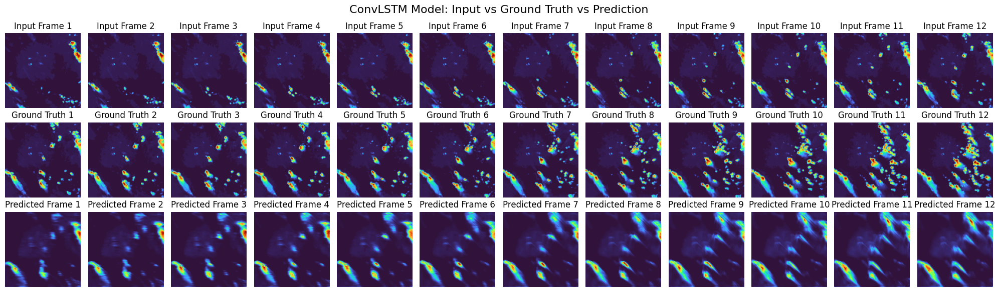

In [ ]:
from utils.plots import PlotTimeSteppingPrediction

# Load the best model
best_model = load_model("best_conv_lstm_vil128.h5", compile=False)
best_model.compile(optimizer=Adam(learning_rate=1e-4), loss='mae', metrics=['mae'])
print("Best model loaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_test, y_test, sample_index=None, colormap='viridis')

### Visuliase prediction on training datasets

Best model loaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


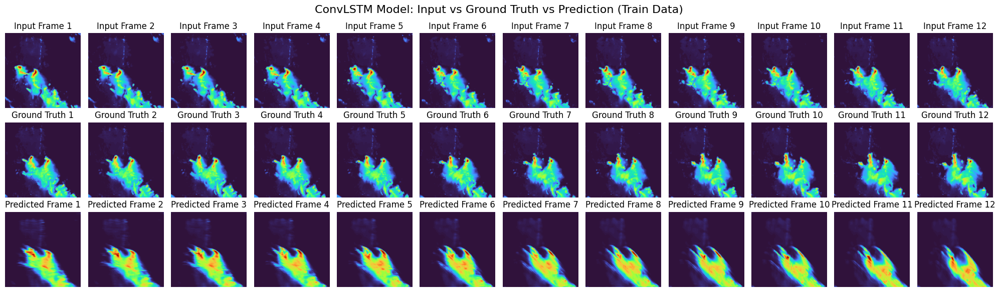

In [ ]:
best_model = load_model("best_conv_lstm_vil128.h5", compile=False)
best_model.compile(optimizer=Adam(learning_rate=1e-4), loss='mae', metrics=['mae'])
print("Best model loaded and recompiled successfully!")


# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_train, y_train, sample_index=None, colormap='viridis')


## Model explaination:

The baseline model is a ConvLSTM-based architecture: Using ConvLSTM2D layers makes the model capable of capturing spatio-temporal dependencies, which is crucial for storm forecasting.

1. Two ConvLSTM2D layers with 64 filters each.
2. Batch Normalization after each ConvLSTM layer for stable training.
3. A final Conv3D layer with a sigmoid activation for output generation.
4. otal Parameters: ~447K, making it a relatively lightweight model.

### loss curve Observation
The model learns well initially, with training loss converging nicely.
The general trend of validation loss is decreasing, meaning the model does generalize to some extent.
Validation loss instability suggests that the model is struggling to generalize consistently.
Overfitting risk: The training loss is much smoother compared to the validation loss, indicating the model memorizes training data better than test data.


### Analysis of model prediction

- Input frames (top row) are well-structured and contain storm patterns.
- Ground truth frames (middle row) show clearly defined storm cell locations.
- Predicted frames (bottom row) generally capture the storm movement, However, The structure of the storm becomes blurry over time. The intensity of certain regions is underestimated and Fine details in the storm are lost in the later frames

Pros:
- The general shape and motion of storms are captured.
- Lightweight Model: Only 447K parameters, making it efficient for training and deployment.
- Captures Large-Scale Motion: The overall movement of storms is learned well, despite some detail loss.


Cons:
- Blurriness issue: The predicted frames lose sharpness as they progress, which is common in ConvLSTM models due to mean-squared loss (MSE/MAE) averaging pixel intensities.
- Diminishing storm intensity: The model tends to smooth out fine details instead of preserving sharp storm structures.
Long-Term Prediction Degradation: Model struggles to maintain consistency over a longer time horizon.
- Blurry Predictions: Loss of fine storm structures, especially in later frames.
- Validation Instability: Fluctuations in validation loss indicate potential overfitting or insufficient regularization.
- Underestimation of Extreme Values: Storm intensity is often dampened, which can be a critical issue for accurate forecasting.
Long-Term Prediction Degradation: Model struggles to maintain consistency over a longer time horizon.



## UNetLSTM Model

Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 128, 128, 12,   │              0 │ -                      │
│ (InputLayer)              │ 1)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_lstm2d_14            │ (None, 128, 128, 12,   │         38,144 │ input_layer_5[0][0]    │
│ (ConvLSTM2D)              │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_14    │ (None, 128, 128, 12,   │            128 │ conv_lstm2d_14[0][0]   │
│ (BatchNormalization)      │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_lstm2d_15            │ (None, 128, 128, 12,   │        221,440 │ batch_normalization_1… │
│ (ConvLSTM2D)              │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_15    │ (None, 128, 128, 12,   │            256 │ conv_lstm2d_15[0][0]   │
│ (BatchNormalization)      │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_lstm2d_16            │ (None, 128, 128, 12,   │        885,248 │ batch_normalization_1… │
│ (ConvLSTM2D)              │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_16    │ (None, 128, 128, 12,   │            512 │ conv_lstm2d_16[0][0]   │
│ (BatchNormalization)      │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_lstm2d_17            │ (None, 128, 128, 12,   │      3,539,968 │ batch_normalization_1… │
│ (ConvLSTM2D)              │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_17    │ (None, 128, 128, 12,   │          1,024 │ conv_lstm2d_17[0][0]   │
│ (BatchNormalization)      │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_transpose_6        │ (None, 128, 128, 12,   │      1,769,728 │ batch_normalization_1… │
│ (Conv3DTranspose)         │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 128, 128, 12,   │              0 │ conv3d_transpose_6[0]… │
│ (Concatenate)             │ 384)                   │                │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_transpose_7        │ (None, 128, 128, 12,   │      1,327,232 │ concatenate_6[0][0]    │
│ (Conv3DTranspose)         │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_7             │ (None, 128, 128, 12,   │              0 │ conv3d_transpose_7[0]… │
│ (Concatenate)             │ 192)                   │                │ batch_normalization_1… │
├──────────────────────

 Total params: 8,118,113 (30.97 MB)

 Trainable params: 8,117,153 (30.96 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 143s 999ms/step - loss: 0.1175 - mae: 0.1175 - val_loss: 0.0623 - val_mae: 0.0623
Epoch 2/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms/step - loss: 0.0632 - mae: 0.0632 - val_loss: 0.0590 - val_mae: 0.0590
Epoch 3/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms/step - loss: 0.0575 - mae: 0.0575 - val_loss: 0.0606 - val_mae: 0.0606
Epoch 4/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms/step - loss: 0.0517 - mae: 0.0517 - val_loss: 0.0924 - val_mae: 0.0924
Epoch 5/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms/step - loss: 0.0484 - mae: 0.0484 - val_loss: 0.0967 - val_mae: 0.0967
Epoch 6/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms/step - loss: 0.0454 - mae: 0.0454 - val_loss: 0.0971 - val_mae: 0.0971
Epoch 7/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms/step - loss: 0.0418 - mae: 0.0418 - val_loss: 0.0809 - val_mae: 0.0809
Epoch 8/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms/step - loss: 0.0403 - mae: 0.0403 - val_loss: 0.0856 - val_mae: 0.0856
Epoch 9/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 45s 941ms

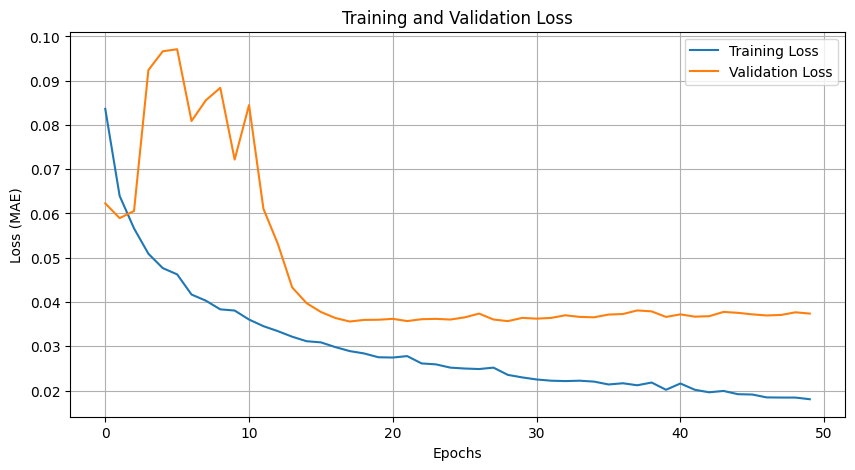

Model saved as unet_lstm_vil_128_model.h5


In [ ]:
input_shape = (128, 128, 12, 1)  # (H, W, T, C)
output_frames = 12
model_predictor = ModelTimeSteppingPrediction(input_shape, output_frames)

# Create and compile the model
model = model_predictor.create_unetlstm_model()
model.summary()

# **train model**
epochs = 50
batch_size = 4
trained_model, history = model_predictor.train_model(model, X_train, y_train, X_test, y_test, epochs=epochs, batch_size=batch_size)

# save the model
model.save("unet_lstm_vil_128_model.h5")
print("Model saved as unet_lstm_vil_128_model.h5")


Model reloaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


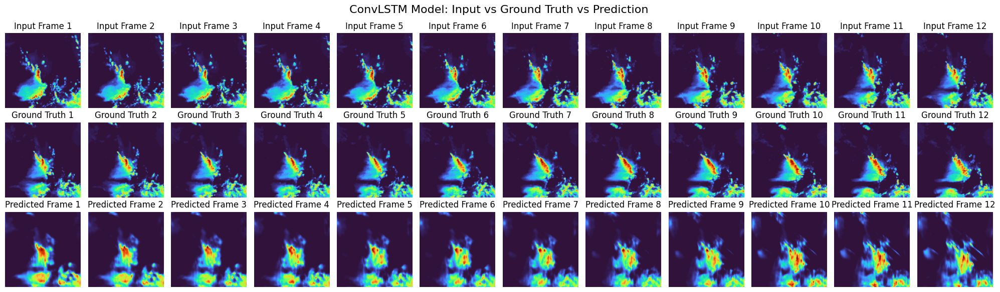

In [ ]:
# Load the trained model without relying on saved metrics
model = load_model("unet_lstm_vil_128_model.h5", compile=False)

# Recompile the model with metrics defined explicitly
model.compile(optimizer=Adam(learning_rate=1e-4), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# Confirm model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_test, y_test, sample_index=None, colormap='viridis')


Model reloaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


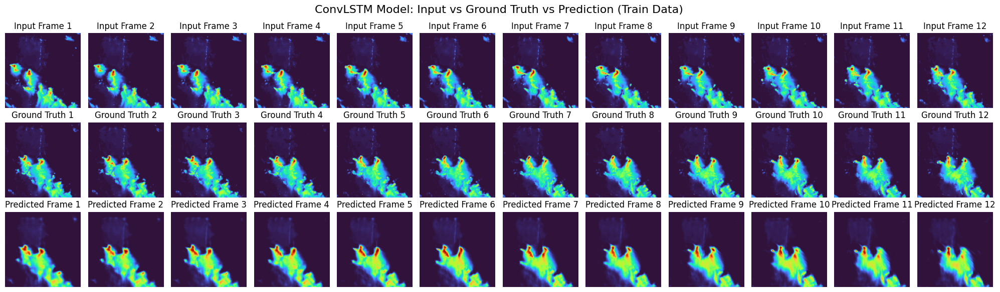

In [ ]:
# load model
model = load_model("unet_lstm_vil_128_model.h5", compile=False)

# recompile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# ensure model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_train, y_train, sample_index=None, colormap='viridis')


## UNet-LSTM model Explaination

The UNet-LSTM architecture introduces encoder-decoder skip connections to the ConvLSTM structure, which helps in preserving spatial details while maintaining temporal dependencies.

### Loss Curve Analysis
The training loss (blue) steadily decreases, indicating smooth optimization.
The validation loss (orange) is much more stable than the previous ConvLSTM model, showing less fluctuation after initial epochs.
The final validation MAE is lower compared to the first model, suggesting that UNet-LSTM generalizes better.

### Prediction Quality
Better sharpness: Compared to the baseline ConvLSTM model, UNet-LSTM predictions retain more detailed storm structures.
Less blurriness: The later frames are less degraded, meaning the model can maintain better spatial consistency over time.
More accurate storm intensity: The predicted images show stronger high-intensity regions, preserving the original storm’s dynamics.

### Remaining Issues
Some predictions still lose detail over time, especially in the last few frames.
There is still a small validation gap, which could mean slight overfitting.


## 3D CNN UNet Model

Selected event IDs: ['S778114', 'S767475', 'S771210', 'S782022', 'S769788', 'S782134', 'S780339', 'S780175', 'S769599', 'S780322']
Input shape: (1200, 192, 192, 12, 1)
Target shape: (1200, 192, 192, 12, 1)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14            │ (None, 192, 192, 12,   │              0 │ -                      │
│ (InputLayer)              │ 1)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_13 (Conv3D)        │ (None, 192, 192, 12,   │            896 │ input_layer_14[0][0]   │
│                           │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_53    │ (None, 192, 192, 12,   │            128 │ conv3d_13[0][0]        │
│ (BatchNormalization)      │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_14 (Conv3D)        │ (None, 192, 192, 12,   │         55,360 │ batch_normalization_5… │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_54    │ (None, 192, 192, 12,   │            256 │ conv3d_14[0][0]        │
│ (BatchNormalization)      │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_15 (Conv3D)        │ (None, 192, 192, 12,   │        221,312 │ batch_normalization_5… │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_55    │ (None, 192, 192, 12,   │            512 │ conv3d_15[0][0]        │
│ (BatchNormalization)      │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_16 (Conv3D)        │ (None, 192, 192, 12,   │        884,992 │ batch_normalization_5… │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_56    │ (None, 192, 192, 12,   │          1,024 │ conv3d_16[0][0]        │
│ (BatchNormalization)      │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_transpose_39       │ (None, 192, 192, 12,   │        884,864 │ batch_normalization_5… │
│ (Conv3DTranspose)         │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_39            │ (None, 192, 192, 12,   │              0 │ conv3d_transpose_39[0… │
│ (Concatenate)             │ 256)                   │                │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_transpose_40       │ (None, 192, 192, 12,   │        442,432 │ concatenate_39[0][0]   │
│ (Conv3DTranspose)         │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_40            │ (None, 192, 192, 12,   │              0 │ conv3d_transpose_40[0… │
│ (Concatenate)             │ 128)                   │                │ batch_normalization_5… │
├──────────────────────

 Total params: 2,604,129 (9.93 MB)

 Trainable params: 2,603,169 (9.93 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/50
120/120 ━━━━━━━━━━━━━━━━━━━━ 148s 836ms/step - loss: 0.0338 - mae: 0.1031 - val_loss: 0.0337 - val_mae: 0.1504 - learning_rate: 1.0000e-04
Epoch 2/50
120/120 ━━━━━━━━━━━━━━━━━━━━ 84s 700ms/step - loss: 0.0161 - mae: 0.0699 - val_loss: 0.0337 - val_mae: 0.0964 - learning_rate: 1.0000e-04
Epoch 3/50
120/120 ━━━━━━━━━━━━━━━━━━━━ 84s 701ms/step - loss: 0.0133 - mae: 0.0607 - val_loss: 0.0277 - val_mae: 0.0852 - learning_rate: 1.0000e-04
Epoch 4/50
120/120 ━━━━━━━━━━━━━━━━━━━━ 84s 701ms/step - loss: 0.0126 - mae: 0.0575 - val_loss: 0.0191 - val_mae: 0.0778 - learning_rate: 1.0000e-04
Epoch 5/50
120/120 ━━━━━━━━━━━━━━━━━━━━ 84s 702ms/step - loss: 0.0125 - mae: 0.0574 - val_loss: 0.0194 - val_mae: 0.0753 - learning_rate: 1.0000e-04
Epoch 6/50
120/120 ━━━━━━━━━━━━━━━━━━━━ 84s 702ms/step - loss: 0.0122 - mae: 0.0574 - val_loss: 0.0150 - val_mae: 0.0704 - learning_rate: 1.0000e-04
Epoch 7/50
120/120 ━━━━━━━━━━━━━━━━━━━━ 84s 702ms/step - loss: 0.0116 - mae: 0.0553 - val_loss: 0.0152 - 

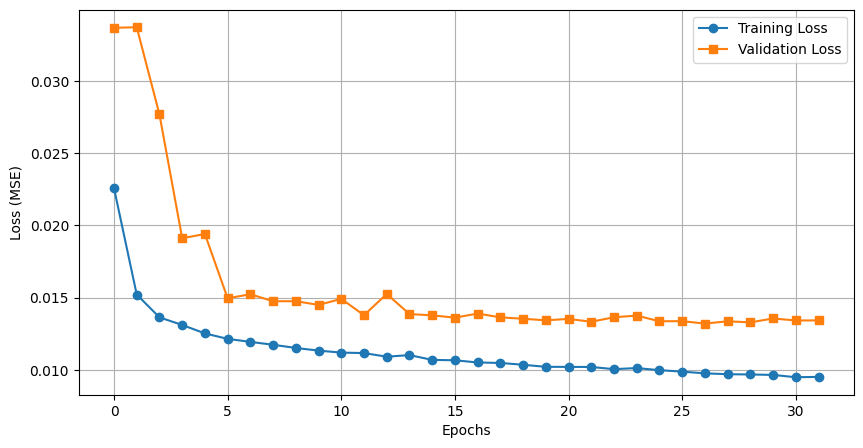

Model saved as unet3d_vil_192_model.h5


In [ ]:
input_shape = (192, 192, 12, 1)
output_frames = 12
model_predictor = ModelTimeSteppingPrediction(input_shape, output_frames)

# Create and compile the model
model = model_predictor.create_unet3d_model()
model.summary()

# **train model**
epochs = 50
batch_size = 8
trained_model, history = model_predictor.train_model(model, X_train, y_train, X_test, y_test, epochs=epochs, batch_size=batch_size)

# **save model**
model.save("unet3d_vil_192_model.h5")
print("Model saved as unet3d_vil_192_model.h5")


Model reloaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


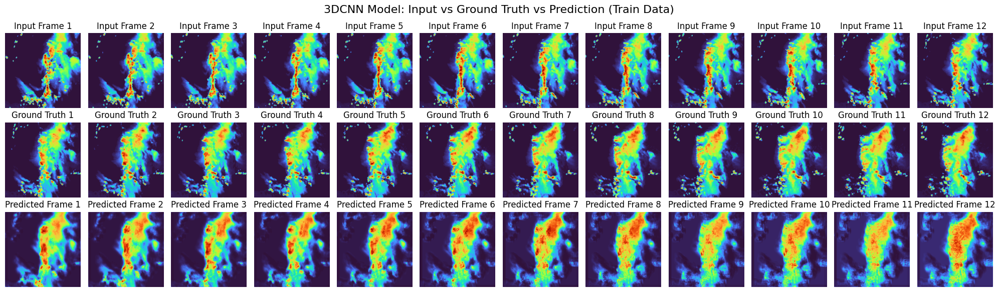

In [ ]:
# load the trained model without relying on saved metrics
model = load_model("unet3d_vil_192_model.h5", compile=False)

# recompile the model with metrics defined explicitly
model.compile(optimizer=Adam(learning_rate=5e-5), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# ensure model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_train, y_train, sample_index=None, colormap='viridis')

Model reloaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


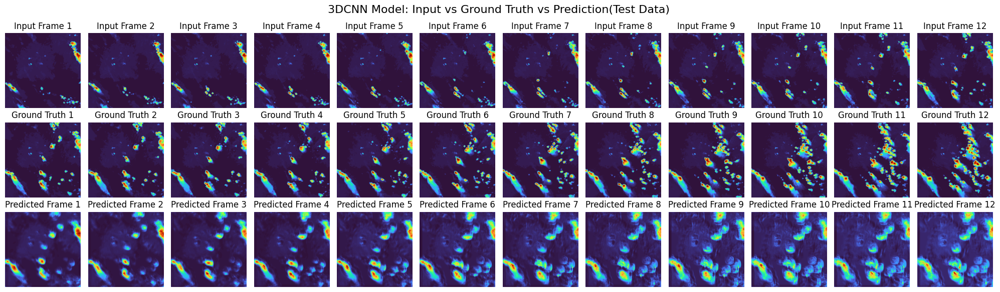

In [ ]:
# Load the trained model without relying on saved metrics
model = load_model("unet3d_vil_192_model.h5", compile=False)

# Recompile the model with metrics defined explicitly
model.compile(optimizer=Adam(learning_rate=5e-5), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# Confirm model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_test, y_test, sample_index=None, colormap='viridis')


## UNet-3DCNN Model Improvement

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 128, 128, 12,   │              0 │ -                      │
│ (InputLayer)              │ 1)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_75 (Conv3D)        │ (None, 128, 128, 12,   │            896 │ input_layer_5[0][0]    │
│                           │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_76 (Conv3D)        │ (None, 128, 128, 12,   │         27,680 │ conv3d_75[0][0]        │
│                           │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_25    │ (None, 128, 128, 12,   │            128 │ conv3d_76[0][0]        │
│ (BatchNormalization)      │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_77 (Conv3D)        │ (None, 128, 128, 12,   │         55,360 │ batch_normalization_2… │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_78 (Conv3D)        │ (None, 128, 128, 12,   │        110,656 │ conv3d_77[0][0]        │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_26    │ (None, 128, 128, 12,   │            256 │ conv3d_78[0][0]        │
│ (BatchNormalization)      │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_79 (Conv3D)        │ (None, 128, 128, 12,   │        221,312 │ batch_normalization_2… │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_80 (Conv3D)        │ (None, 128, 128, 12,   │        442,496 │ conv3d_79[0][0]        │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_27    │ (None, 128, 128, 12,   │            512 │ conv3d_80[0][0]        │
│ (BatchNormalization)      │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_81 (Conv3D)        │ (None, 128, 128, 12,   │        884,992 │ batch_normalization_2… │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_82 (Conv3D)        │ (None, 128, 128, 12,   │      1,769,728 │ conv3d_81[0][0]        │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_28    │ (None, 128, 128, 12,   │          1,024 │ conv3d_82[0][0]        │
│ (BatchNormalization)      │ 256)                   │                │                        │
├──────────────────────

 Total params: 11,590,849 (44.22 MB)

 Trainable params: 11,589,633 (44.21 MB)

 Non-trainable params: 1,216 (4.75 KB)

Epoch 1/50
240/240 ━━━━━━━━━━━━━━━━━━━━ 325s 657ms/step - loss: 0.0322 - mae: 0.0957 - val_loss: 0.0382 - val_mae: 0.0961 - learning_rate: 1.0000e-04
Epoch 2/50
240/240 ━━━━━━━━━━━━━━━━━━━━ 147s 612ms/step - loss: 0.0102 - mae: 0.0515 - val_loss: 0.0159 - val_mae: 0.0779 - learning_rate: 1.0000e-04
Epoch 3/50
240/240 ━━━━━━━━━━━━━━━━━━━━ 147s 612ms/step - loss: 0.0086 - mae: 0.0460 - val_loss: 0.0115 - val_mae: 0.0616 - learning_rate: 1.0000e-04
Epoch 4/50
240/240 ━━━━━━━━━━━━━━━━━━━━ 148s 615ms/step - loss: 0.0080 - mae: 0.0441 - val_loss: 0.0106 - val_mae: 0.0498 - learning_rate: 1.0000e-04
Epoch 5/50
240/240 ━━━━━━━━━━━━━━━━━━━━ 148s 618ms/step - loss: 0.0077 - mae: 0.0427 - val_loss: 0.0103 - val_mae: 0.0497 - learning_rate: 1.0000e-04
Epoch 6/50
240/240 ━━━━━━━━━━━━━━━━━━━━ 148s 618ms/step - loss: 0.0069 - mae: 0.0397 - val_loss: 0.0098 - val_mae: 0.0490 - learning_rate: 1.0000e-04
Epoch 7/50
240/240 ━━━━━━━━━━━━━━━━━━━━ 147s 613ms/step - loss: 0.0068 - mae: 0.0402 - val_loss: 0.0

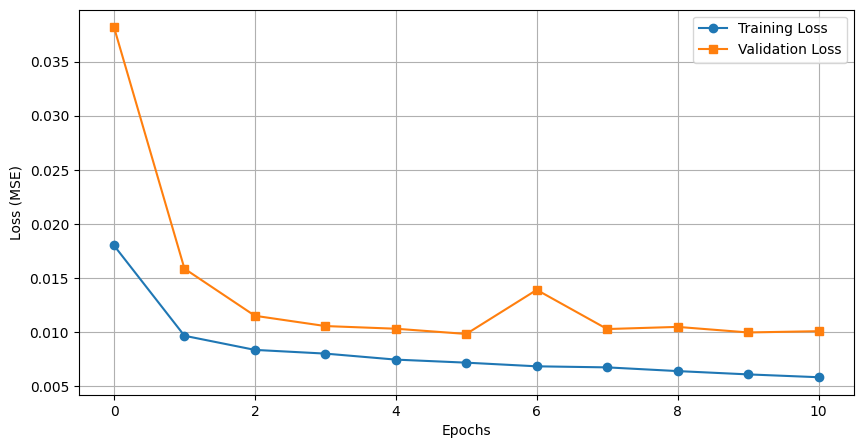

Model saved as deepunet3d_vil_192_model.h5


In [ ]:
input_shape = (128, 128, 12, 1)
output_frames = 12
model_predictor = ModelTimeSteppingPrediction(input_shape, output_frames)

# Create and compile the model
model = model_predictor.create_deep_unet3d_model()
model.summary()

# **train model**
epochs = 50
batch_size = 4
trained_model, history = model_predictor.train_model(model, X_train, y_train, X_test, y_test, epochs=epochs, batch_size=batch_size)


model.save("deepunet3d_vil_192_model.h5")
print("Model saved as deepunet3d_vil_192_model.h5")


Model reloaded and recompiled successfully!


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


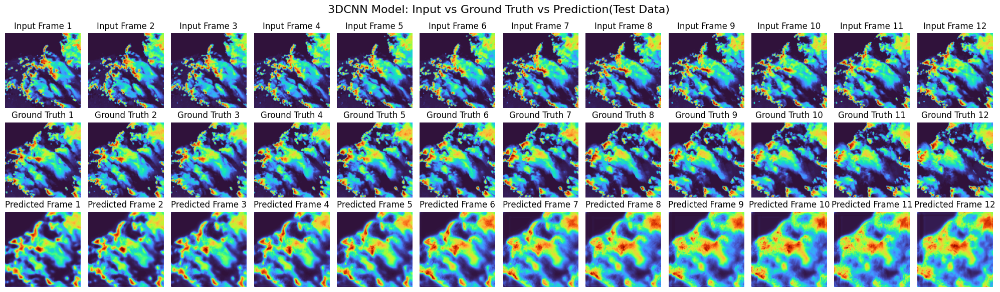

In [ ]:
# Load the trained model without relying on saved metrics
model = load_model("deepunet3d_vil_192_model.h5", compile=False)

# Recompile the model with metrics defined explicitly
model.compile(optimizer=Adam(learning_rate=5e-5), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# Confirm model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_test, y_test, sample_index=None, colormap='viridis')


## Loss Analysis

- Unlike ConvLSTM and UNet-LSTM, which exhibited fluctuations in validation loss, the 3D CNN UNet validation loss stabilizes much faster (around epoch 5).
This suggests that the model generalizes better and is less prone to overfitting.
- Lower Overall MSE Compared to Previous Models

- The final validation loss remains consistently lower than ConvLSTM and UNet-LSTM. This indicates that the 3D CNN UNet is numerically more accurate in its predictions.

### Less Training-Validation Gap

- ConvLSTM had a significant gap between training and validation loss, suggesting overfitting.
- UNet-LSTM reduced this gap, but still showed signs of generalization issues.
- 3D CNN UNet has the smallest gap, meaning it is learning patterns that translate well to unseen data.

3D CNN UNet outperforms both ConvLSTM and UNet-LSTM in terms of:

- Stability
- Lower loss
- Better generalization

In [ ]:
# example reading in the csv for surprise task 1
df = pd.read_csv("data/surprise_events1.csv", parse_dates=["start_utc"])
print(f"Number of unique events: {len(df.id.unique())}")
df.head()

Number of unique events: 10


,id,img_type,start_utc,llcrnrlat,llcrnrlon,urcrnrlat,urcrnrlon,proj,height_m,width_m
0,S844398,ir069,2019-07-29 19:49:00+00:00,33.568521,-99.143269,36.986895,-94.869356,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
1,S844398,ir107,2019-07-29 19:49:00+00:00,33.568521,-99.143269,36.986895,-94.869356,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
2,S844398,lght,NaT,33.568521,-99.143269,36.986895,-94.869356,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3,S844398,vil,2019-07-29 19:50:00+00:00,33.568521,-99.143269,36.986895,-94.869356,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
4,S844398,vis,2019-07-29 19:49:00+00:00,33.568521,-99.143269,36.986895,-94.869356,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0


In [ ]:
model = tf.keras.models.load_model("/content/deepunet3d_vil_192_model.h5", custom_objects=custom_objects)

# remove warning
# model.compile(optimizer="adam", loss="mean_squared_error", metrics=["mae"])

# load surprise data
surprise_h5_path = "/content/data/surprise_task1.h5"
model_path = "/content/deepunet3d_vil_192_model.h5"

data_loader = EventDataLoader(surprise_h5_path, events_csv_path)

task1_ids = ['S844398', 'S851491', 'S851111', 'S837416', 'S849444',
             'S843931', 'S858827', 'S856118', 'S849552', 'S854791']

# Run prediction and save
data_loader.predict_and_save(model_path, task1_ids, output_dir="predictions", input_frames=12, image_size=(128, 128))


1/1 ━━━━━━━━━━━━━━━━━━━━ 60s 60s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
prediction completed and saved！


In [ ]:
# choose one storm event (first)
storm_id = "S844398"
file_path = f"predictions/Alberto-task1a-vil-{storm_id}.npy"

# load .npy file
pred_vil = np.load(file_path)  # Shape: (384, 384, 12)

print(f"Loaded prediction shape: {pred_vil.shape}")


Loaded prediction shape: (384, 384, 12)


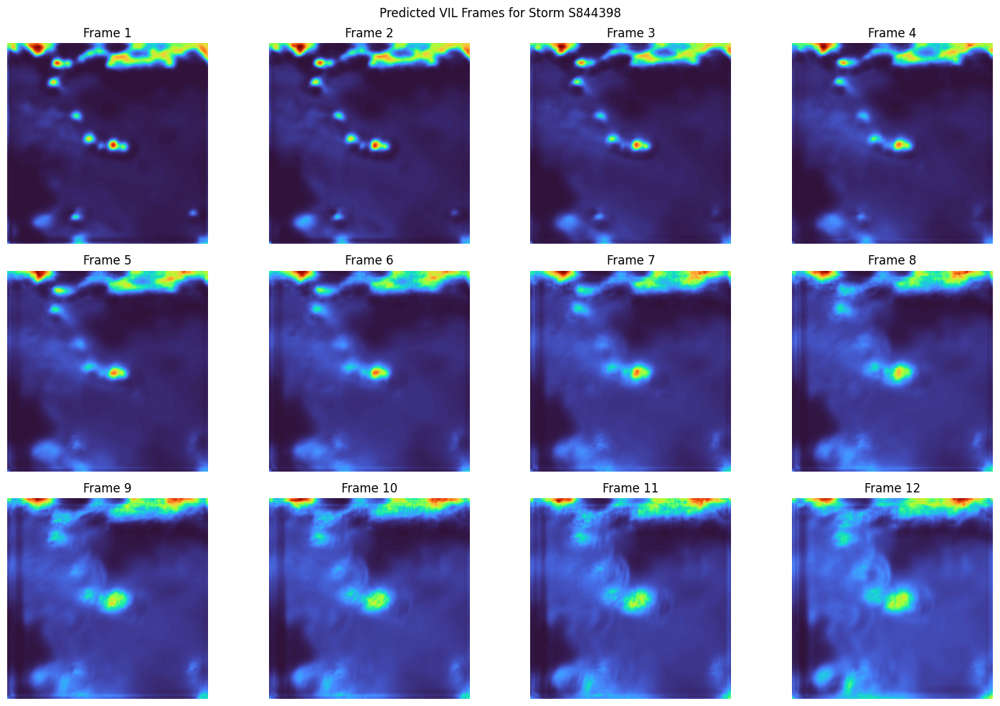

In [ ]:
# Create an instance of the plot class
plotter = PlotTimeSteppingPrediction()

# Call the plot function
plotter.plot_surprise_prediction(pred_vil, storm_id)

# Task 1b: Dataset consists of four mortalities ("vis", "ir069", "ir107", "vil") images with 12 input frames predicting "vil" imageds with 12 future frames.

## Data preprocessing
Preprocessing steps include:

Resizing all the mortality images to the same smaller pixel format.As 384x384 needs more computational cost and time consuming, our computational resources may not support the process.
Normalization: Ensuring values are scaled properly.
Splitting into train/test sets (80/20 split)

In [ ]:
# Instantiate the data loader
data_loader = EventDataLoader(h5_file_path, events_csv_path)

# Get event IDs
event_ids = data_loader.get_event_ids(image_type="vil")

# Preprocess data for multiple modalities
modalities = ["vis", "ir069", "ir107", "vil"]
X, y = data_loader.preprocess_data(event_ids, input_frames=12, target_frames=12, image_size=(128, 128), modalities=modalities)

# Split train and test data
X_train, X_test, y_train, y_test = data_loader.split_train_test(X, y)

# Check the shapes of the resulting arrays
print("X shape:", X.shape)  # Expected shape: (num_samples, input_frames, 128, 128, num_modalities)
print("y shape:", y.shape)  # Expected shape: (num_samples, target_frames, 128, 128, 1)

Selected event IDs: ['S778114', 'S767475', 'S771210', 'S782022', 'S769788', 'S782134', 'S780339', 'S780175', 'S769599', 'S780322']
X shape: (1200, 128, 128, 12, 4)
y shape: (1200, 128, 128, 12)


## Baseline: ConvLSTM model


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv_lstm2d_20 (ConvLSTM2D)          │ (None, 128, 128, 12, 64)    │         156,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 128, 128, 12, 64)    │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_21 (ConvLSTM2D)          │ (None, 128, 128, 12, 64)    │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 128, 128, 12, 64)    │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_10 (Conv3D)                   │ (None, 128, 128, 12, 1)     │           1,729 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 454,337 (1.73 MB)

 Trainable params: 454,081 (1.73 MB)

 Non-trainable params: 256 (1.00 KB)

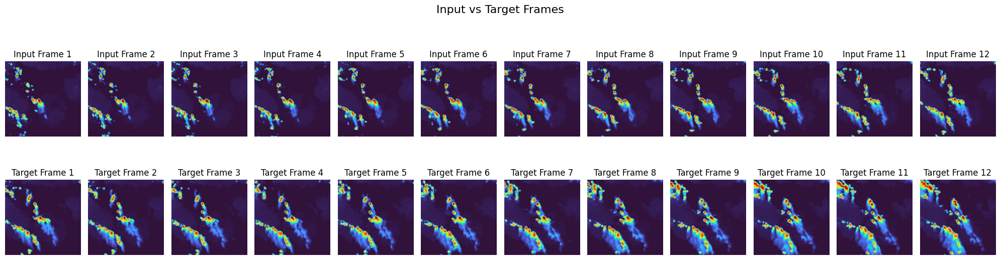

Epoch 1/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - loss: 0.0337 - mae: 0.1144
Epoch 1: val_loss improved from inf to 0.01813, saving model to best_conv_lstm_vil128.h5


480/480 ━━━━━━━━━━━━━━━━━━━━ 113s 224ms/step - loss: 0.0337 - mae: 0.1144 - val_loss: 0.0181 - val_mae: 0.0749 - learning_rate: 0.0010
Epoch 2/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0156 - mae: 0.0720
Epoch 2: val_loss did not improve from 0.01813
480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0156 - mae: 0.0720 - val_loss: 0.0198 - val_mae: 0.0965 - learning_rate: 0.0010
Epoch 3/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0133 - mae: 0.0647
Epoch 3: val_loss did not improve from 0.01813
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0133 - mae: 0.0647 - val_loss: 0.0201 - val_mae: 0.0679 - learning_rate: 0.0010
Epoch 4/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0117 - mae: 0.0590
Epoch 4: val_loss improved from 0.01813 to 0.01749, saving model to best_conv_lstm_vil128.h5


480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0117 - mae: 0.0590 - val_loss: 0.0175 - val_mae: 0.0873 - learning_rate: 0.0010
Epoch 5/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0114 - mae: 0.0573
Epoch 5: val_loss improved from 0.01749 to 0.01683, saving model to best_conv_lstm_vil128.h5


480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0114 - mae: 0.0573 - val_loss: 0.0168 - val_mae: 0.0645 - learning_rate: 0.0010
Epoch 6/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0110 - mae: 0.0565
Epoch 6: val_loss did not improve from 0.01683
480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0110 - mae: 0.0565 - val_loss: 0.0190 - val_mae: 0.0823 - learning_rate: 0.0010
Epoch 7/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0101 - mae: 0.0529
Epoch 7: val_loss improved from 0.01683 to 0.01433, saving model to best_conv_lstm_vil128.h5


480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0101 - mae: 0.0529 - val_loss: 0.0143 - val_mae: 0.0620 - learning_rate: 0.0010
Epoch 8/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0103 - mae: 0.0539
Epoch 8: val_loss did not improve from 0.01433
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0103 - mae: 0.0539 - val_loss: 0.0144 - val_mae: 0.0619 - learning_rate: 0.0010
Epoch 9/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0104 - mae: 0.0540
Epoch 9: val_loss did not improve from 0.01433
480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0104 - mae: 0.0540 - val_loss: 0.0153 - val_mae: 0.0816 - learning_rate: 0.0010
Epoch 10/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0101 - mae: 0.0532
Epoch 10: val_loss did not improve from 0.01433
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0101 - mae: 0.0532 - val_loss: 0.0155 - val_mae: 0.0833 - learning_rate: 0.0010
Epoch 11/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0

480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0096 - mae: 0.0511 - val_loss: 0.0136 - val_mae: 0.0605 - learning_rate: 0.0010
Epoch 12/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0097 - mae: 0.0514
Epoch 12: val_loss did not improve from 0.01360
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0097 - mae: 0.0514 - val_loss: 0.0142 - val_mae: 0.0585 - learning_rate: 0.0010
Epoch 13/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0093 - mae: 0.0500
Epoch 13: val_loss did not improve from 0.01360
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0093 - mae: 0.0500 - val_loss: 0.0143 - val_mae: 0.0584 - learning_rate: 0.0010
Epoch 14/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0090 - mae: 0.0493
Epoch 14: val_loss improved from 0.01360 to 0.01314, saving model to best_conv_lstm_vil128.h5


480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0090 - mae: 0.0493 - val_loss: 0.0131 - val_mae: 0.0582 - learning_rate: 0.0010
Epoch 15/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0091 - mae: 0.0497
Epoch 15: val_loss did not improve from 0.01314
480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0091 - mae: 0.0497 - val_loss: 0.0135 - val_mae: 0.0626 - learning_rate: 0.0010
Epoch 16/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0088 - mae: 0.0483
Epoch 16: val_loss did not improve from 0.01314
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0088 - mae: 0.0483 - val_loss: 0.0151 - val_mae: 0.0819 - learning_rate: 0.0010
Epoch 17/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0086 - mae: 0.0481
Epoch 17: val_loss did not improve from 0.01314
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0086 - mae: 0.0481 - val_loss: 0.0136 - val_mae: 0.0691 - learning_rate: 0.0010
Epoch 18/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - los

480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0075 - mae: 0.0440 - val_loss: 0.0129 - val_mae: 0.0605 - learning_rate: 8.0000e-04
Epoch 24/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0073 - mae: 0.0437
Epoch 24: val_loss did not improve from 0.01293
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0073 - mae: 0.0437 - val_loss: 0.0133 - val_mae: 0.0567 - learning_rate: 8.0000e-04
Epoch 25/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0075 - mae: 0.0439
Epoch 25: val_loss did not improve from 0.01293
480/480 ━━━━━━━━━━━━━━━━━━━━ 105s 220ms/step - loss: 0.0075 - mae: 0.0439 - val_loss: 0.0138 - val_mae: 0.0628 - learning_rate: 8.0000e-04
Epoch 26/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0074 - mae: 0.0438
Epoch 26: val_loss did not improve from 0.01293
480/480 ━━━━━━━━━━━━━━━━━━━━ 106s 220ms/step - loss: 0.0074 - mae: 0.0438 - val_loss: 0.0135 - val_mae: 0.0590 - learning_rate: 8.0000e-04
Epoch 27/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 0s 

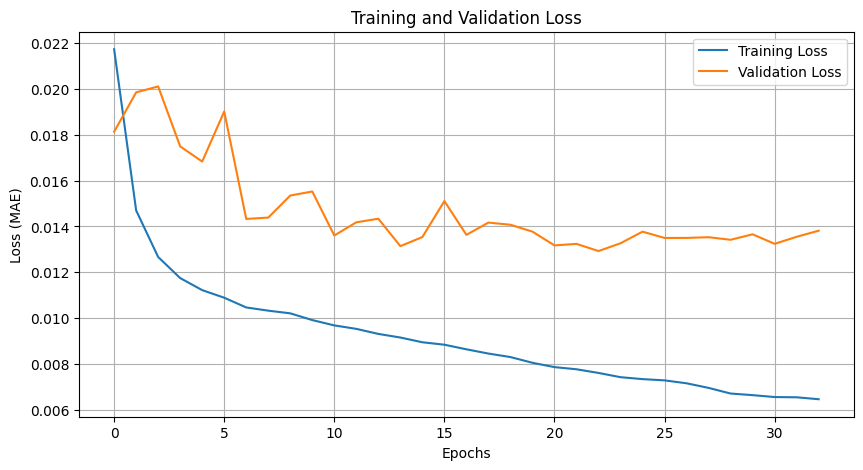

In [ ]:
# Instantiate the class
input_shape = (128, 128, 12, 4)
output_frames = 12
model_predictor = ModelTimeSteppingPrediction(input_shape, output_frames)

# Create and compile the model
model = model_predictor.create_conv_lstm()
model.summary()

# **train model**
epochs = 100
batch_size = 2
trained_model, history = model_predictor.train_model(model, X_train, y_train, X_test, y_test, epochs=epochs, batch_size=batch_size)

### Visuliase prediction on Test datasets

Best model loaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


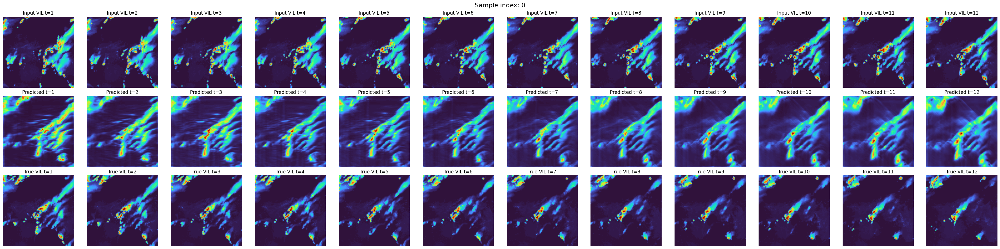

In [ ]:
# Load the best model
best_model = load_model("best_conv_lstm_vil128.h5", compile=False)
best_model.compile(optimizer=Adam(learning_rate=1e-4), loss='mae', metrics=['mae'])
print("Best model loaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(best_model, X_test, y_test, sample_index=None, colormap='viridis')


## Model explaination:

The baseline model is a ConvLSTM-based architecture similar to the baseline model in task1a ,using ConvLSTM2D layers makes the model capable of capturing spatio-temporal dependencies.

The whole model structure contains two ConvLSTM2D layers with 64 filters each, Batch Normalization after each ConvLSTM layer for stable training and a final Conv3D layer with a sigmoid activation for output generation.

### loss curve Observation
Training loss:
In the initial stage, the model learns well with training loss converging in a smooth curve.

Validation loss:
However, as is shown in the validation loss curve, the general trend of validation loss is decreasing, but locally it shows instablity, which means an unpleasant generalization ability.

Overall performance:
The training loss is much smoother and lower than the validation loss, indicating an overfitting risk .


### Analysis of model prediction

With the comparison of the three rows (top row for Input frames, second row for Ground truth frames, bottom row for Predicted frames), the model shows the ablity of capturing the trend of storm movement, but becomes blurry and inaccurate over time. The prime details in the predicted plots are missing over time and seem to be more similar to the input frames, which indicates the model is struggling in learning the features as time step increases.


## 3D Unet CNN Model

In [ ]:
input_shape = (128, 128, 12, 4)
output_frames = 12
model_predictor = ModelTimeSteppingPrediction(input_shape, output_frames)

# Create and compile the model
model = model_predictor.create_unet3d_multimodal()
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 128, 128, 12,   │              0 │ -                      │
│ (InputLayer)              │ 4)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_24 (Conv3D)        │ (None, 128, 128, 12,   │          3,488 │ input_layer_2[0][0]    │
│                           │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_25 (Conv3D)        │ (None, 128, 128, 12,   │         27,680 │ conv3d_24[0][0]        │
│                           │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_8     │ (None, 128, 128, 12,   │            128 │ conv3d_25[0][0]        │
│ (BatchNormalization)      │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_26 (Conv3D)        │ (None, 128, 128, 12,   │         55,360 │ batch_normalization_8… │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_27 (Conv3D)        │ (None, 128, 128, 12,   │        110,656 │ conv3d_26[0][0]        │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_9     │ (None, 128, 128, 12,   │            256 │ conv3d_27[0][0]        │
│ (BatchNormalization)      │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_28 (Conv3D)        │ (None, 128, 128, 12,   │        221,312 │ batch_normalization_9… │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_29 (Conv3D)        │ (None, 128, 128, 12,   │        442,496 │ conv3d_28[0][0]        │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_10    │ (None, 128, 128, 12,   │            512 │ conv3d_29[0][0]        │
│ (BatchNormalization)      │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_30 (Conv3D)        │ (None, 128, 128, 12,   │        884,992 │ batch_normalization_1… │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_31 (Conv3D)        │ (None, 128, 128, 12,   │      1,769,728 │ conv3d_30[0][0]        │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_11    │ (None, 128, 128, 12,   │          1,024 │ conv3d_31[0][0]        │
│ (BatchNormalization)      │ 256)                   │                │                        │
├──────────────────────

 Total params: 5,841,377 (22.28 MB)

 Trainable params: 5,840,417 (22.28 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 345s 860ms/step - loss: 0.0337 - mae: 0.1006 - val_loss: 0.0431 - val_mae: 0.1582 - learning_rate: 1.0000e-04
Epoch 2/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 106s 736ms/step - loss: 0.0125 - mae: 0.0569 - val_loss: 0.0408 - val_mae: 0.1685 - learning_rate: 1.0000e-04
Epoch 3/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 106s 738ms/step - loss: 0.0101 - mae: 0.0511 - val_loss: 0.0257 - val_mae: 0.1265 - learning_rate: 1.0000e-04
Epoch 4/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 106s 738ms/step - loss: 0.0091 - mae: 0.0475 - val_loss: 0.0191 - val_mae: 0.0910 - learning_rate: 1.0000e-04
Epoch 5/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 106s 737ms/step - loss: 0.0088 - mae: 0.0460 - val_loss: 0.0133 - val_mae: 0.0762 - learning_rate: 1.0000e-04
Epoch 6/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 106s 738ms/step - loss: 0.0080 - mae: 0.0444 - val_loss: 0.0124 - val_mae: 0.0612 - learning_rate: 1.0000e-04
Epoch 7/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 106s 737ms/step - loss: 0.0081 - mae: 0.0446 - val_loss: 0.0

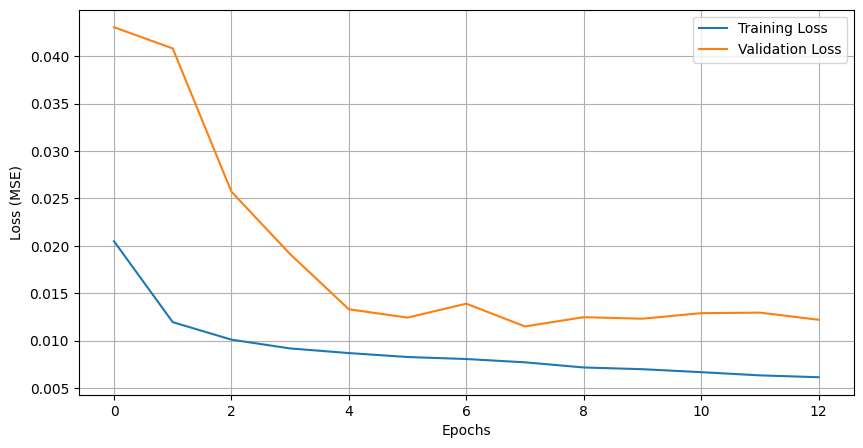

Model saved as 3dcnnunet1_vil_128_model.h5


In [ ]:
# **train model**
epochs = 50
batch_size = 4
trained_model, history = model_predictor.train_model(model, X_train, y_train, X_test, y_test, epochs=epochs, batch_size=batch_size)

# **save model**
model.save("3dcnnunet1_vil_128_model.h5")
print("Model saved as 3dcnnunet1_vil_128_model.h5")


Model reloaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


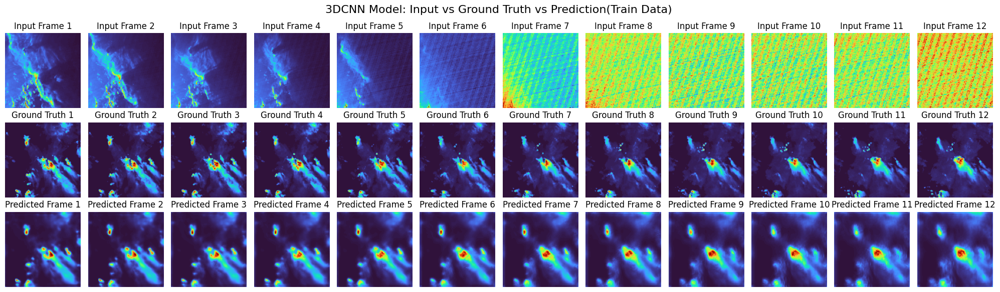

In [ ]:
from tensorflow.keras.models import load_model
# Load the trained model without relying on saved metrics
model = load_model("/content/3dcnnunet_vil_128_model.h5", compile=False)

# Recompile the model with metrics defined explicitly
model.compile(optimizer=Adam(learning_rate=5e-5), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# Confirm model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_test, y_test, sample_index=None, colormap='viridis')

Model reloaded and recompiled successfully!
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


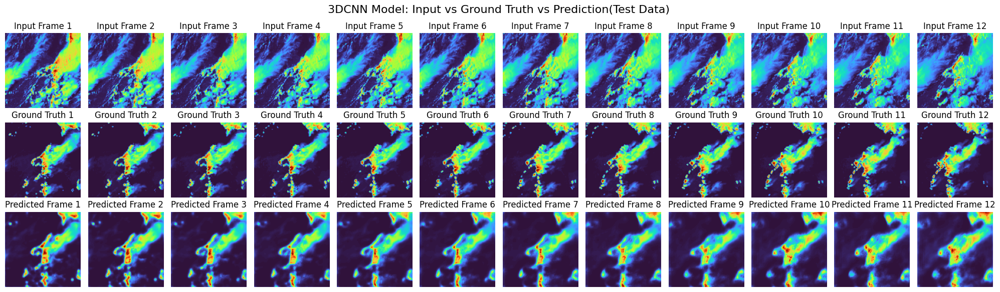

In [ ]:
from tensorflow.keras.models import load_model
# Load the trained model without relying on saved metrics
model = load_model("/content/3dcnnunet_vil_128_model.h5", compile=False)

# Recompile the model with metrics defined explicitly
model.compile(optimizer=Adam(learning_rate=5e-5), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# Confirm model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_test, y_test, sample_index=None, colormap='viridis')

Model reloaded and recompiled successfully!


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


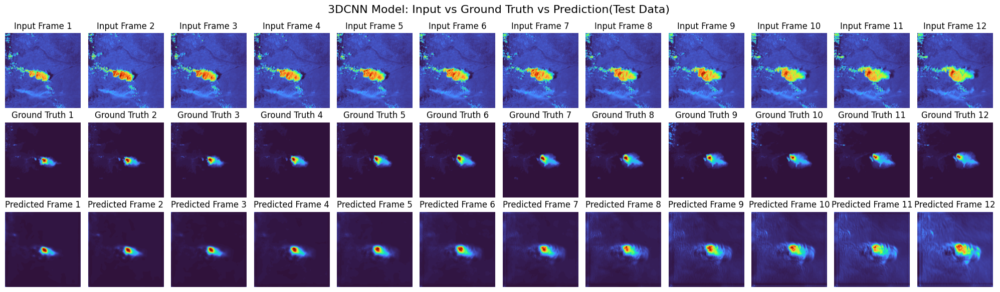

In [ ]:
from tensorflow.keras.models import load_model
# Load the trained model without relying on saved metrics
model = load_model("/content/3dcnnunet1_vil_128_model.h5", compile=False)

# Recompile the model with metrics defined explicitly
model.compile(optimizer=Adam(learning_rate=5e-5), loss='mae', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# Confirm model is reloaded and recompiled successfully
print("Model reloaded and recompiled successfully!")

# Instantiate the plot class
plotter = PlotTimeSteppingPrediction()

plotter.visualize_sample_prediction(model, X_test, y_test, sample_index=None, colormap='viridis')


### **3D-Unet-CNN Model Explanation**
The 3D-Unet-CNN architecture combines encoder-decoder skip connections with 3D-CNN layers. This design preserves spatial details while maintaining temporal dependencies, enhancing the model’s ability to learn both local and sequential patterns.


### Loss Curve Observation
1. Training Loss:  
   - The training loss decreases rapidly during the early stages and converges smoothly. This suggests the model effectively learns features from the input data.

2. Validation Loss:  
   - The validation loss follows a similar trend, decreasing and stabilizing over time. This indicates good generalization capability, as the model avoids overfitting.

3. Overall Performance:  
   - The gap between training and validation loss is minimal, and both curves remain stable as training progresses. This balance demonstrates a robust learning process and model stability.


### Model Prediction Analysis
1. Trend and Shape Prediction:
   - The model accurately captures the storm’s movement trends and shapes across frames. However, as time progresses, the predictions become slightly blurred, particularly around the edges. Despite this, the key features of the input frames are well-preserved.

2. Detail Preservation:  
   - Although fine details diminish over time, the model’s predictions remain significantly better than those of the baseline model, which struggled to capture key patterns.

3. Test Data Performance:  
   - On test data, the model successfully captures trends similar to the ground truth, addressing a critical shortcoming of the baseline. Its ability to generalize well to unseen data highlights strong model reliability, an essential factor in evaluating performance.


# Comparison and Analysis of Task 1a and Task 1b on Baseline and 3D-Unet-CNN Model


## Comparison of Performance

### Loss Curve Observation
- Training Loss:  
  Both single-modality and multi-modality models show smooth, converging training loss curves, indicating effective feature learning.

- Validation Loss:  
  Validation loss trends are favorable, with rapid initial convergence. Multi-modality models display improved feature learning and generalization.

- Overall Performance:  
  Models trained on multi-modality data demonstrate better convergence, stability, and generalization compared to single-modality models.

### Model Prediction Analysis
- Multi-modality models capture storm movement trends and shapes more precisely, though predictions become blurry at the edges over time.
- Compared to single-modality models, multi-modality models outperform in terms of:
  - Stability
  - Lower loss
  - Better generalization


## Probable Reasons for Improved Performance

### 1. Complementarity of Multimodal Data
Limitations of Single Modality:
- Each modality offers unique information, single modality captures only partial features, specifically, with VIL shows thunderstorm intensity but not cloud structure or temperature.

Advantages of Multimodal Input:
- By integrating different data types, the model can predict effectively under various conditions.  
  Example: When visible light fails at night, infrared data still provides useful insights.


### 2. Enhanced Feature Representation
- Single-Modality Limitation:  
  Models learn limited local features based on one modality.
  
- Multi-Modality Advantage:
  The integration of multiple modalities enables the model to capture complex global relationships, improving feature representation and generalization.


### 3. Reduced Information Loss
Critical features missing in one modality can be supplemented by others. This complementarity reduces prediction errors and enhances model robustness.


### 4. Mitigation of Data Noise
- Single-modality data is more sensitive to noise as less modality is used and can't be complemented by other modalities.
  
- Multi-Modality Models:  
  By sharing and weighting features across modalities, the model can reduce the impact of noisy data, improving reliability and accuracy.
